In [1]:
# run "pip install ipython-autotime" in your conda env
%load_ext autotime

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

RANDOM_SEED = 2402

/hps/scratch/lsf_tmpdir/hl-codon-01-02/ipykernel_606597/1468454086.py:4: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


time: 6.42 ms (started: 2022-08-04 16:04:46 +01:00)


In [2]:
import sys
import os
from glob import glob
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import copy
import anndata
import matplotlib.pyplot as plt

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

scv.logging.print_version()
scv.set_figure_params()

Running scvelo 0.2.4 (python 3.9.12) on 2022-08-04 16:04.
time: 4.19 s (started: 2022-08-04 16:04:46 +01:00)


ERROR: XMLRPC request failed [code: -32500]
RuntimeError: PyPI's XMLRPC API is currently disabled due to unmanageable load and will be deprecated in the near future. See https://status.python.org/ for more information.


In [3]:
cluster_colours = {
    "Epiblast" : "#635547",
    "Primitive Streak" : "#DABE99",
    "Anterior Primitive Streak" : "#c19f70",
    "Early Nascent Mesoderm" : "#DFCDE4",
    "Late Nascent Mesoderm" : "#C594BF",
    "Head Mesoderm" : "#7E508D",
    "Cardiopharyngeal Mesoderm" : "#B51D8D",
    "Endothelium" : "#ff891c",
    "Posterior PSM 1" : "#6eb8b5",
    "Posterior PSM 2" : "#479b98",
    "Anterior PSM 1" : "#8ac5e3",
    "Anterior PSM 2" : "#459AC0",
    "Somites" : "#006f9e",
    #"Somites" : "#00405c",
    "Mature Somites" : "#00405c",
    #"Mature Somites" : "#00BFC4",
    "Caudal Epiblast" : "#9E6762",
    "NMPs" : "#8EC792",
    "Caudal Neurectoderm" : "#65A83E",
    "Early Spinal Cord" : "#99C463",
    "Late Spinal Cord" : "#CDE088",
    "Early Neurectoderm" : "#649146",
    "Late Neurectoderm" : "#647a4f",
    "Neurons" : "#414f33",
    "Notochord" : "#0F4A9C",
    "Mature Endoderm" : "#EF5A9D",
    "PGCs" : "#FACB12"
}

# the order in which I plot the clusters
cluster_order = [ "Epiblast", "Primitive Streak", "Anterior Primitive Streak", 
                   "Early Nascent Mesoderm", "Late Nascent Mesoderm", "Head Mesoderm", "Cardiopharyngeal Mesoderm", "Endothelium",
                   "Posterior PSM 1", "Posterior PSM 2", "Anterior PSM 1", "Anterior PSM 2", "Somites", "Mature Somites",
                   "Caudal Epiblast", "NMPs", "Caudal Neurectoderm", "Early Spinal Cord", "Late Spinal Cord",
                   "Early Neurectoderm", "Late Neurectoderm", "Neurons",
                   "Notochord", "Mature Endoderm", "PGCs" ]

# gastruloid timepoint colours
timepoint_colours = { "d3" : "#cd1400",
                       "d3_d3.5" : "#DA4800",
                       "d3.5" : "#E67D00",
                       "d3.5_d4" : "#EEA416",
                       "d4" : "#f6ca2b",
                       "d4_d4.5" : "#BEBC50",
                       "d4.5" : "#85ad76",
                       "d4.5_d5" : "#699D95",
                       "d5" : "#4d8db4"
                      }

time: 1.34 ms (started: 2022-08-04 16:04:50 +01:00)


In [4]:
adata_meso = sc.read_h5ad("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_meso_scv_dynam.h5ad.gz")
adata_neural = sc.read_h5ad("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_neural_scv_dynam.h5ad.gz")

time: 50.4 s (started: 2022-08-04 16:04:50 +01:00)


In [5]:
adata = adata_meso.concatenate(adata_neural, batch_key="gastr_type_new")
colPalette_celltype = [cluster_colours[i] for i in sorted(np.unique(adata.obs['cluster']))]
adata.uns['cluster_colors'] = colPalette_celltype

colPalette_stage = [timepoint_colours[i] for i in sorted(np.unique(adata.obs['timepoint']))]
adata.uns['timepoint_colors'] = colPalette_stage

time: 5.34 s (started: 2022-08-04 16:05:40 +01:00)


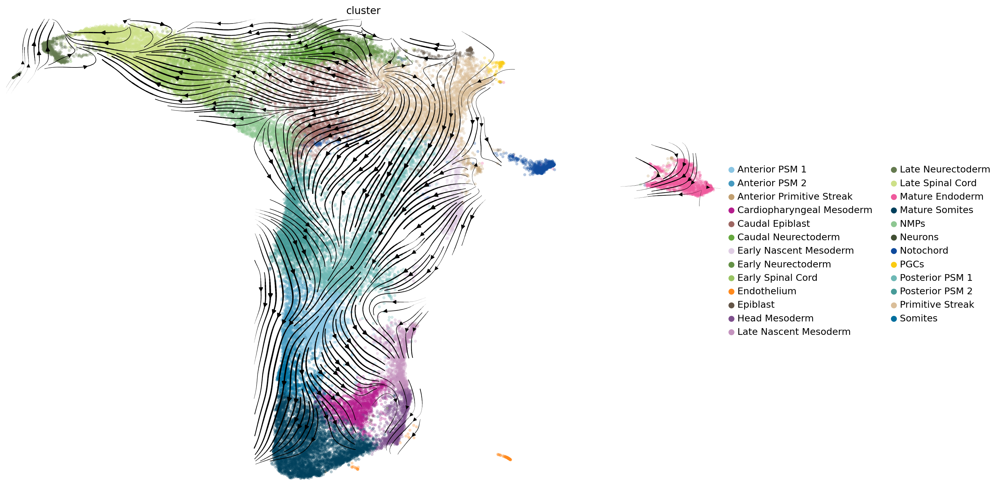

time: 14.4 s (started: 2022-08-04 16:05:46 +01:00)


In [6]:
fig, axs = plt.subplots(1,1, figsize = (15,10))
scv.pl.velocity_embedding_stream(adata, basis="umap", color="cluster", size=50, ax = axs, density=5, legend_loc="right")

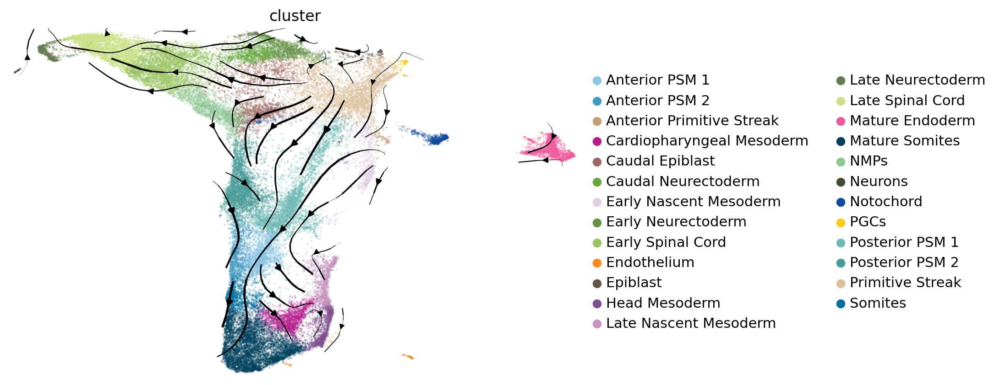

time: 5.96 s (started: 2022-08-04 16:06:00 +01:00)


In [7]:
fig, axs = plt.subplots(1,1, figsize = (8,5))
scv.pl.velocity_embedding_stream(adata, basis="umap", color="cluster", size=10, ax = axs, density=1, legend_loc="right")

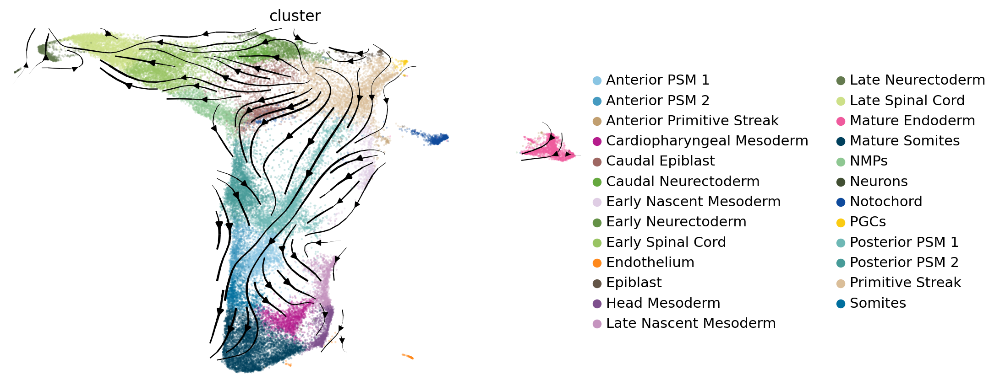

time: 6.22 s (started: 2022-08-04 16:06:06 +01:00)


In [8]:
fig, axs = plt.subplots(1,1, figsize = (8,5))
scv.pl.velocity_embedding_stream(adata, basis="umap", color="cluster", size=10, ax = axs, density=1.5, legend_loc="right")

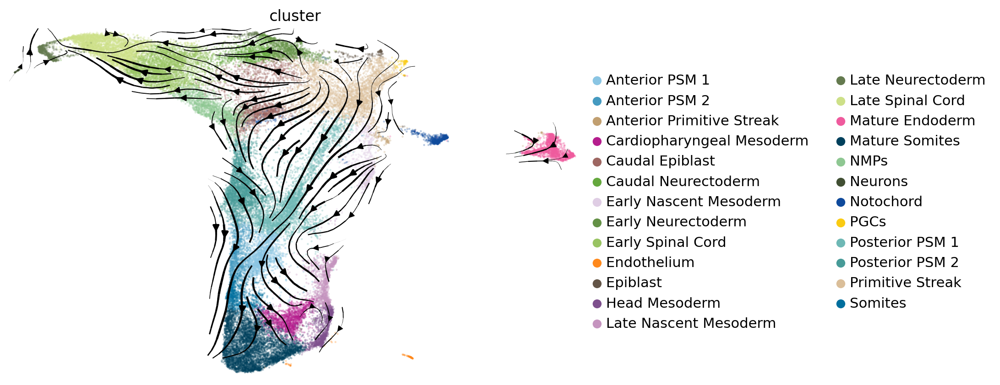

time: 5.89 s (started: 2022-08-04 16:06:12 +01:00)


In [9]:
fig, axs = plt.subplots(1,1, figsize = (8,5))
scv.pl.velocity_embedding_stream(adata, basis="umap", color="cluster", size=10, ax = axs, density=2, legend_loc="right")
fig.savefig('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/final_plots/Fig1/F.png', dpi=300)

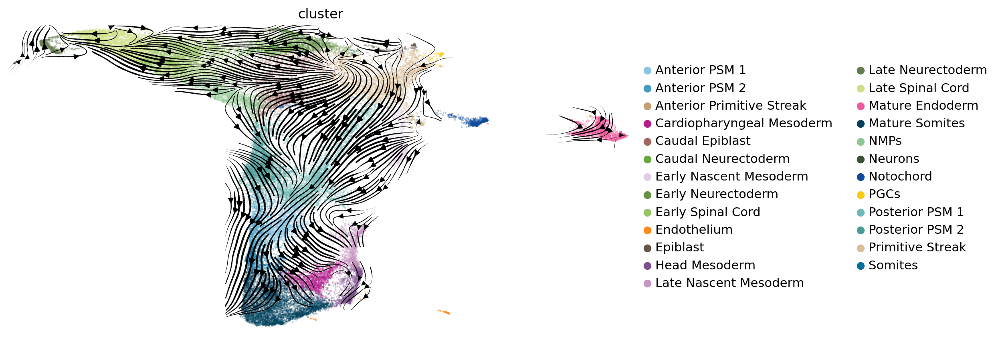

time: 7.25 s (started: 2022-07-19 13:14:45 +01:00)


In [37]:
fig, axs = plt.subplots(1,1, figsize = (10,5))
scv.pl.velocity_embedding_stream(adata, basis="umap", color="cluster", size=10, ax = axs, density=5, legend_loc="right")

In [7]:
adata_meso = sc.read_h5ad("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_meso_cr.h5ad.gz")
adata_neural = sc.read_h5ad("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/anndata_neural_cr.h5ad.gz")

/nfs/research/marioni/Leah/software/conda_envs/cellrank/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


time: 1min 2s (started: 2022-07-19 09:45:27 +01:00)


/nfs/research/marioni/Leah/software/conda_envs/cellrank/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [8]:
adata = adata_meso.concatenate(adata_neural, batch_key="gastr_type_new")
colPalette_celltype = [cluster_colours[i] for i in sorted(np.unique(adata.obs['cluster']))]
adata.uns['cluster_colors'] = colPalette_celltype

colPalette_stage = [timepoint_colours[i] for i in sorted(np.unique(adata.obs['timepoint']))]
adata.uns['timepoint_colors'] = colPalette_stage

time: 3.24 s (started: 2022-07-19 09:46:29 +01:00)


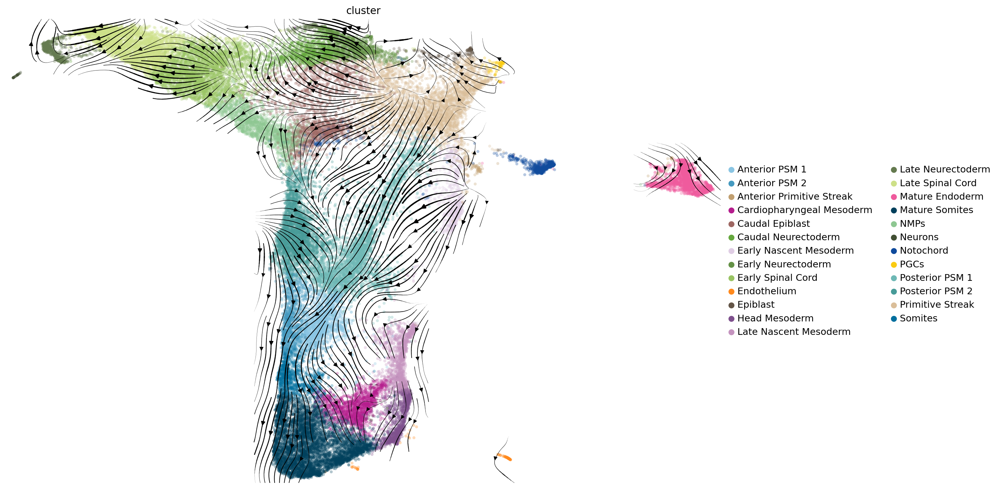

time: 8 s (started: 2022-07-19 09:46:32 +01:00)


In [9]:
fig, axs = plt.subplots(1,1, figsize = (15,10))
scv.pl.velocity_embedding_stream(adata, vkey="T_fwd", basis="umap", color="cluster", size=50, ax = axs, density=5, legend_loc="right")

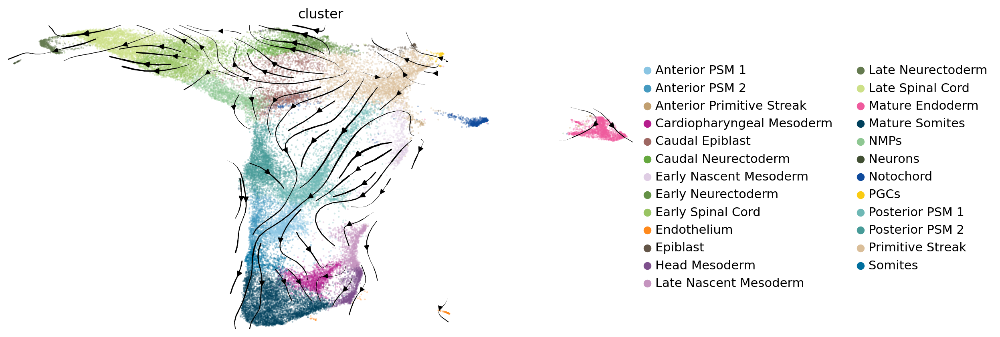

time: 2.52 s (started: 2022-07-19 10:02:23 +01:00)


In [14]:
fig, axs = plt.subplots(1,1, figsize = (10,5))
scv.pl.velocity_embedding_stream(adata, vkey="T_fwd", basis="umap", color="cluster", size=10, ax = axs, density=1.5, legend_loc="right")

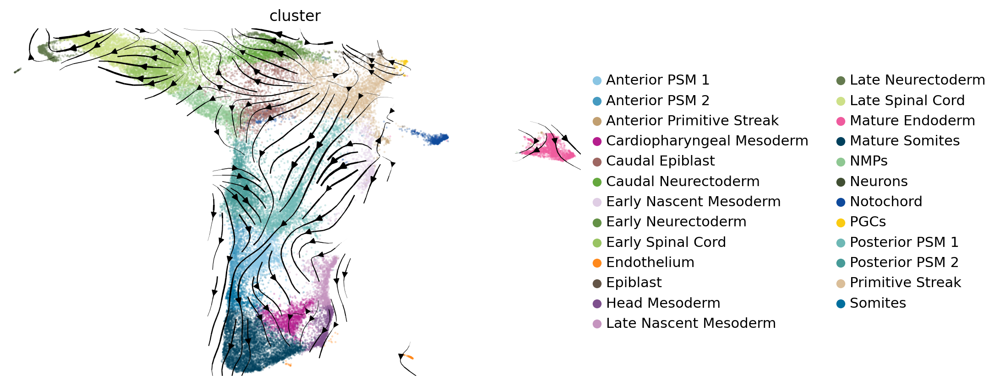

time: 2.93 s (started: 2022-07-19 10:07:02 +01:00)


In [22]:
fig, axs = plt.subplots(1,1, figsize = (8,5))
scv.pl.velocity_embedding_stream(adata, vkey="T_fwd", basis="umap", color="cluster", size=10, ax = axs, density=2, legend_loc="right")

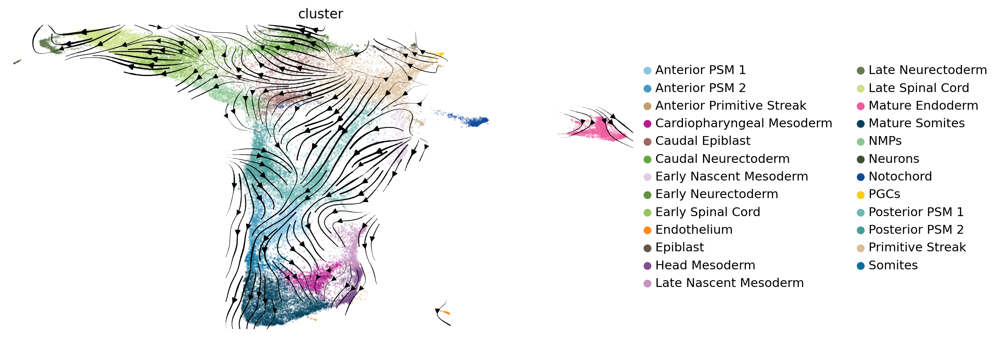

time: 3.77 s (started: 2022-07-19 10:04:30 +01:00)


In [18]:
fig, axs = plt.subplots(1,1, figsize = (10,5))
scv.pl.velocity_embedding_stream(adata, vkey="T_fwd", basis="umap", color="cluster", size=10, ax = axs, density=3, legend_loc="right")

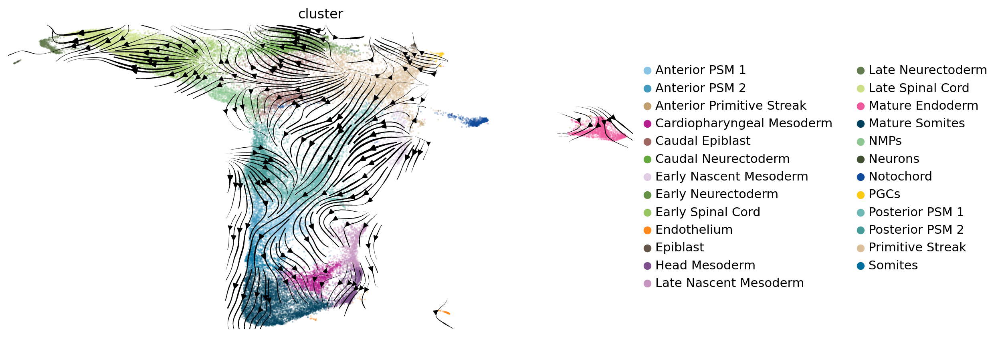

time: 5.04 s (started: 2022-07-19 10:04:45 +01:00)


In [19]:
fig, axs = plt.subplots(1,1, figsize = (10,5))
scv.pl.velocity_embedding_stream(adata, vkey="T_fwd", basis="umap", color="cluster", size=10, ax = axs, density=4, legend_loc="right")

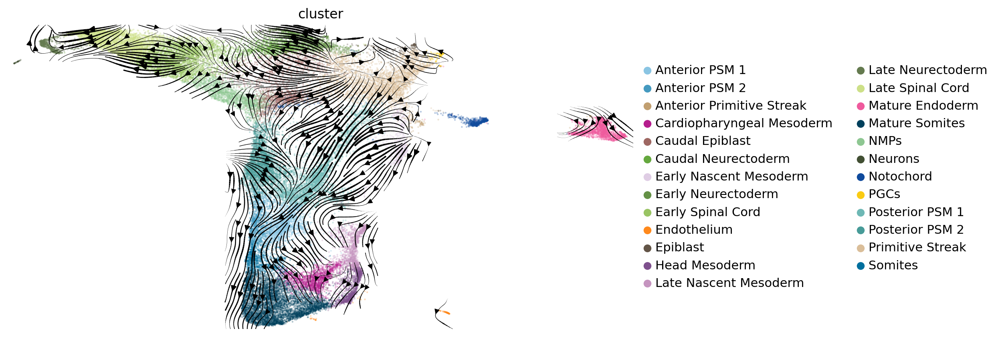

time: 6.93 s (started: 2022-07-19 10:03:44 +01:00)


In [16]:
fig, axs = plt.subplots(1,1, figsize = (10,5))
scv.pl.velocity_embedding_stream(adata, vkey="T_fwd", basis="umap", color="cluster", size=10, ax = axs, density=5, legend_loc="right")